Analysis for T.4_Nr4a1 cell sub type for single cell RNA sequencing data for SKG mice Rheumatoid Arthritis Project


Last Updated on: August 10, 2021

# Import Python Packages

In [ ]:
import sys

#Import libraries
#import scanorama
import time
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
#from skbio.stats.composition import clr

#import doubletdetection
import matplotlib.pyplot as plt
import matplotlib.axes as axes
import matplotlib
#import os
#For CLR of ADTs
import scipy
import scipy.stats
from sklearn.preprocessing import scale
import os
import copy
import itertools
import seaborn as sns
import math
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)


sc.logging.print_versions() 
sc.settings.set_figure_params(dpi=150)

# Load Data


In [ ]:
#Load data
path = 'adata_object/'
adata_file = path + 'adata_only_T_cells.h5ad'
adata = sc.read(adata_file)
print("done")

# UMAP colored by T.4 Nr4a1 cluster

In [14]:
adata.obs['Nr4a1_cluster'] = [str(x == '3') for x in adata.obs['cell_types']]

In [4]:
adata.uns['Nr4a1_cluster_colors'] = ["#36454f",'red']

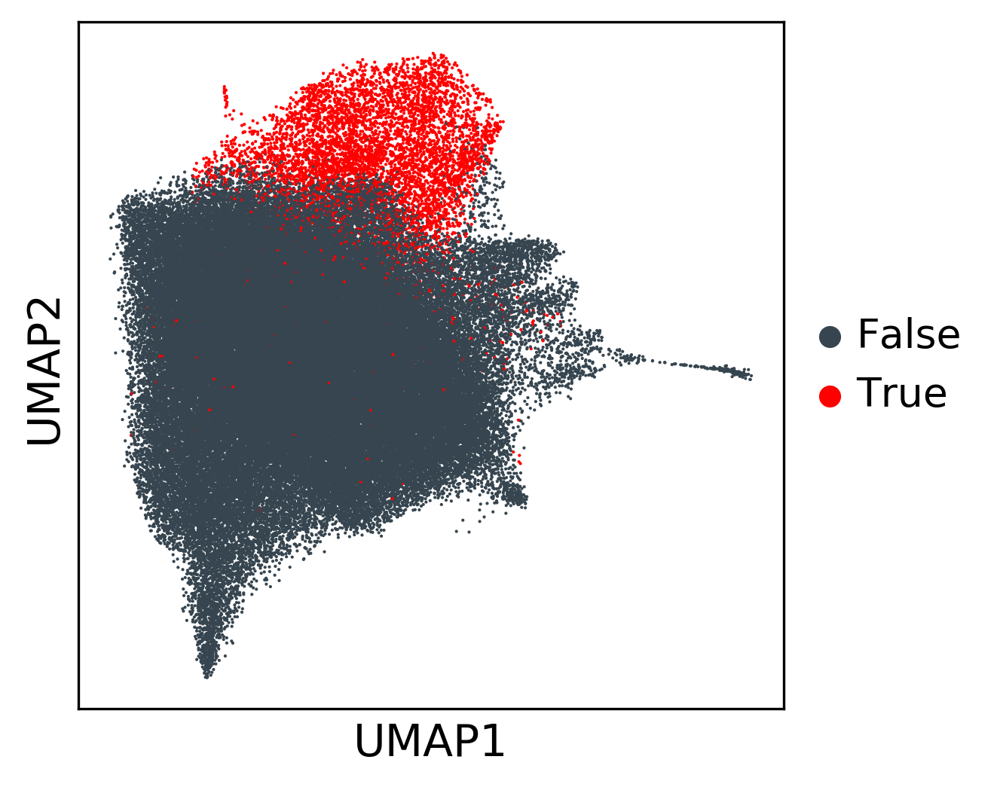

In [7]:

sc.pl.umap(adata, color = 'Nr4a1_cluster', title = "" size = 4)#,  save = "_Nr4a1_hi_other_for_volcano_plot_fig2.svg", size = 4)

# Differential Expression for T.4 Nr4a1 cluster

In [15]:
sc.tl.rank_genes_groups(adata, 'Nr4a1_cluster', n_genes = len(adata.raw.var_names), use_raw=True, groups='all',
                           reference='rest', rankby_abs=False, key_added=None,
                           copy=False, method='wilcoxon',
                           corr_method='benjamini-hochberg', log_transformed=True, pts = True)

ranking genes
... storing 'Nr4a1_cluster' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:31)


In [5]:
adata.uns['rank_genes_groups']['names']['True']

array(['Nr4a1', 'Ptma', 'Cd5', ..., 'Txnip', 'Thy1', 'Selplg'],
      dtype=object)

In [8]:
gene_names = adata.uns['rank_genes_groups']['names']['True']
log_changes = adata.uns['rank_genes_groups']['logfoldchanges']['True']
p_values = adata.uns['rank_genes_groups']['pvals']['True']

updated_p_values = np.array(p_values)
print(np.sum([x == 0 for x in updated_p_values]))
updated_p_values[[x == 0 for x in updated_p_values]] = 2.2250738585072014e-308
print(np.sum([x == 0 for x in updated_p_values]))

rank_df_1 = pd.DataFrame.from_dict({'gene':gene_names, 'log_fold_change':log_changes, 'p_value':updated_p_values})
rank_df_1.index = rank_df_1['gene']

#rank_df_1_subset = rank_df_1.loc[list(nr4a1_df_subset_2.index),:]
rank_df_1["rank"] = np.sign(rank_df_1["log_fold_change"]) * -np.log10(rank_df_1["p_value"])

rank_df_1 = rank_df_1.sort_values('rank', ascending = False)
rank_df_1.loc[:,['gene','rank']].to_csv('results/single_cell_RNA_seq/ranked_lists/Nr4a1_high_cluster_v_other_cells.rnk', index = False, sep = "\t")

33
0


In [23]:
rank_df_1

,gene,log_fold_change,p_value,rank
gene,,,,
Nr4a1,Nr4a1,6.099972,2.225074e-308,307.652656
Dusp2,Dusp2,1.893194,2.225074e-308,307.652656
Nab2,Nab2,3.276349,2.225074e-308,307.652656
Eif4a1,Eif4a1,0.926398,2.225074e-308,307.652656
Zfp36l1,Zfp36l1,1.073673,2.225074e-308,307.652656
...,...,...,...,...
Tmsb4x,Tmsb4x,-0.403891,2.225074e-308,-307.652656
Myl12b,Myl12b,-0.698822,2.225074e-308,-307.652656
Txnip,Txnip,-1.292243,2.225074e-308,-307.652656


In [16]:
percent_df = adata.uns['rank_genes_groups']['pts']

In [17]:
cluster = 'True'

nr4a1_gene_names =  np.array(adata.uns['rank_genes_groups']['names'][cluster])
nr4a1_log_changes = np.array(adata.uns['rank_genes_groups']['logfoldchanges'][cluster])
nr4a1_p_values = np.array(adata.uns['rank_genes_groups']['pvals_adj'][cluster])

In [18]:
nr4a1_df = pd.DataFrame.from_dict({'gene':nr4a1_gene_names,'logfoldchange':nr4a1_log_changes, 'adj_p_value':nr4a1_p_values})
nr4a1_df.index = nr4a1_df['gene']
nr4a1_df['T.4N_Nr4a1_percent'] = list(percent_df.loc[nr4a1_df.index,:]['True'])
nr4a1_df['other_percent'] = list(percent_df.loc[nr4a1_df.index,:]['False'])

In [18]:
len(nr4a1_gene_names)

16666

In [22]:
nr4a1_df = pd.DataFrame.from_dict({'gene':nr4a1_gene_names,'logfoldchange':nr4a1_log_changes, 'adj_p_value':nr4a1_p_values})
nr4a1_df.index = nr4a1_df['gene']
nr4a1_df['T.4N_Nr4a1_percent'] = list(percent_df.loc[nr4a1_df.index,:]['True'])
nr4a1_df['other_percent'] = list(percent_df.loc[nr4a1_df.index,:]['False'])

min_cutoff = 0.01
nr4a1_df_subset = nr4a1_df[[x > min_cutoff or y > min_cutoff for x,y in zip(nr4a1_df['T.4N_Nr4a1_percent'],nr4a1_df['other_percent'])]]

In [23]:
nr4a1_df_subset

,gene,logfoldchange,adj_p_value,T.4N_Nr4a1_percent,other_percent
gene,,,,,
Nr4a1,Nr4a1,6.099972,0.0,0.737461,0.084207
Ptma,Ptma,0.903191,0.0,0.992551,0.979545
Cd5,Cd5,1.834791,0.0,0.813441,0.463104
Hsp90ab1,Hsp90ab1,0.943331,0.0,0.975501,0.929509
Eif5a,Eif5a,1.004779,0.0,0.911935,0.820397
...,...,...,...,...,...
Tmsb4x,Tmsb4x,-0.403891,0.0,0.997683,0.998560
Myl12b,Myl12b,-0.698822,0.0,0.899520,0.963787
Txnip,Txnip,-1.292243,0.0,0.463334,0.709791


In [26]:
updated_p_values = np.array(nr4a1_df_subset['adj_p_value'])
print(np.sum([x == 0 for x in updated_p_values]))
updated_p_values[[x == 0 for x in updated_p_values]] = 2.2250738585072014e-308
print(np.sum([x == 0 for x in updated_p_values]))
nr4a1_df_subset['adj_p_value'] = updated_p_values

33
0


<ipython-input-26-c2d1f6cbe04f>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nr4a1_df_subset['adj_p_value'] = updated_p_values


In [27]:
nr4a1_df_subset.to_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_Nr4a1_high_cluster_versus_other_cells.csv', index = False)

In [19]:
data_to_plot = pd.read_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_Nr4a1_high_cluster_versus_other_cells.csv')
data_to_plot.loc[[x < -1 and y < 0.05 for x,y in zip(data_to_plot['logfoldchange'],data_to_plot['adj_p_value'])],'gene']

8603      Eya2
8604     Kif23
8620    Akap12
8657    Phf11a
8663      Acpp
         ...  
9576     S1pr1
9577      Tspo
9581     Txnip
9582      Thy1
9583    Selplg
Name: gene, Length: 83, dtype: object

# Volcano Plot for T.4N Nr4a1 cluster v other cells

In [33]:
sc.settings.set_figure_params(dpi=300)

<ipython-input-34-aeb3eb9dce2a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nr4a1_df_subset['logpvalue'] = [-np.log10(x) for x in nr4a1_df_subset['adj_p_value']]


['Nr4a1', 'Nab2', 'Thy1', 'eGFP', 'Tnfrsf9', 'Sell', 'Egr1', 'Pdlim4', 'Socs3', 'Nfkbid', 'Tnfrsf4', 'Egr2', 'Egr3', 'Myb', 'Nr4a3', 'Pdcd1', 'Lag3', 'Bcl2a1d', 'Irf4', 'Pdcd1lg2', 'Mir155hg', 'Dntt', 'Cd83', 'Trib1', 'Cd160', 'Rgs16', 'Trpm1', 'Cd24a', 'Ifit3', 'Gzma']


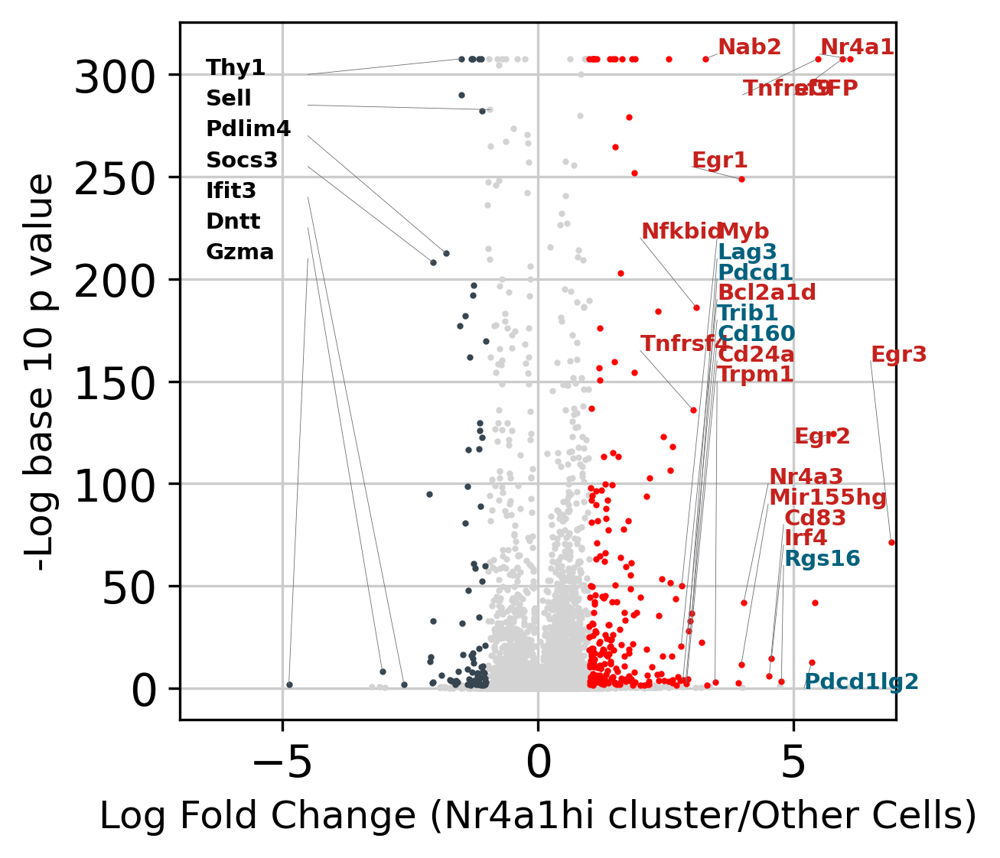

In [34]:
file_save_prefix = "results/single_cell_RNA_seq/"
nr4a1_df_subset['logpvalue'] = [-np.log10(x) for x in nr4a1_df_subset['adj_p_value']]
data_to_plot = nr4a1_df_subset
data_to_plot = data_to_plot.sort_values("logpvalue", ascending = False)
plt.rc('axes', axisbelow=True)

color_values = {(True,True, True):"red", (False, True, True): "#36454f"}
colors = [color_values.get((x > 0, abs(x) > 1, y > -np.log10(0.05)), "lightgrey") for x,y in zip(data_to_plot['logfoldchange'], data_to_plot['logpvalue'])]
for color in ['lightgrey',"red", "#36454f"]:
    subset_data = data_to_plot[[x == color for x in colors]]
    plt.scatter(list(subset_data['logfoldchange']),list(subset_data['logpvalue']), s = 1, edgecolors=color, color =  color)


plt.xlim((-7, 7)) 
plt.xlabel("Log Fold Change (Nr4a1hi cluster/Other Cells)", size = 12)
plt.ylabel("-Log base 10 p value", size = 12)

x = [i for i in data_to_plot['logfoldchange']]
y = [i for i in data_to_plot['logpvalue']]
labels_orig = data_to_plot["gene"]


genes_to_label_left = ["Gzma","Dntt", "Ifit3", "Socs3", "Pdlim4","Thy1", "Sell"]

genes_to_label_right = ["Egr3","Nr4a1","eGFP","Egr2","Tnfrsf9","Pdcd1lg2","Rgs16","Irf4","Cd83","Nr4a3","Mir155hg","Egr1","Alphl","Trpm1","Arhgap200",
                                                                             "Nab2","Nfkbid","Tnfrsf4","Pdcd1","Lag3","Gm26828","Cd24a","Cd160","Trib1","Myb","Bcl2a1d"]



positive_color = "#c6211d"
neutral_color = "#5C5C5C"
negative_color = "#03617d"
other_color = 'black'

genes_to_label_style_dic = {positive_color: ["normal","bold"], neutral_color:["italic","normal"], other_color:["normal","bold"], negative_color:["normal","bold"]}

genes_to_label_color_dic = {"Gzma":["left",other_color],"Dntt":["left",other_color], "Ifit3":["left",other_color], "Socs3":["left",other_color], "Pdlim4":["left",other_color],"Thy1":["left",other_color], "Sell":["left",other_color],
                           "Egr3":["right",positive_color],"Nr4a1":["right",positive_color],"eGFP":["right",positive_color],"Egr2":["right",positive_color],"Tnfrsf9":["right",positive_color],"Lad1":["right",neutral_color],
                           "Pdcd1lg2":["right",negative_color],"Rgs16":["right",negative_color],"Irf4":["right",positive_color],"Cd83":["right",positive_color],"Nr4a3":["right",positive_color],
                           "Mir155hg":["right",positive_color],"Egr1":["right",positive_color],"Alphl":["right",neutral_color],"Trpm1":["right",positive_color],"Arhgap200":["right",positive_color],
                           "Nab2":["right",positive_color],"Marcksl1":["right",neutral_color],"Nfkbid":["right",positive_color],"Tnfrsf4":["right",positive_color],"Pdcd1":["right",negative_color],
                            "Shmt1":["right",neutral_color],"Lag3":["right",negative_color],"Gm26828":["right",neutral_color],"Cd24a":["right",positive_color],"Cd160":["right",negative_color],
                            "Trib1":["right",negative_color],"Myb":["right",positive_color],"Bcl2a1d":["right",positive_color]}


genes_to_label = genes_to_label_left  + genes_to_label_right

to_keep = np.where([i in genes_to_label for i in labels_orig])[0]
labels = list(np.array(labels_orig)[to_keep])
print(labels)
x = list(np.array(x)[to_keep])
y = list(np.array(y)[to_keep])


amt_shift = [[10, -12, -6],
 [10*4, -2*4-4, -2*4],
 [0-20, 2, 2],
 [10+50-20-10-20+20, 2+5+3, 2+5+3],
 [0-30, 2+5+5+5, 2+5+5+3],
 [(10+30)/2+20+20, (2+15)/2+5, (2+15)/2+5],
 [10+70, 2+12, 2+12],
 [10+100-5, 2+10, 2+10], #Cd83
 [10*3, -4-2, -2],
 [10+150, 2+10, 2+10],#Mir155hg
 [10+70+20+20, 2+9, 2+9],
 [10+110+85, 2+11, 2+11],
 [10+150+80, 2+13, 2+13],
 [10+190+80, 2+13, 2+13], #Marcksl1
 [50-5+300+90, 2+18, 2+18],
 [100+300+90, 2+16, 2+16],
 [(7*6-20)/2+45+300+90, 2*3+12, 2*3+12], #Pdcd1
 [120+300+90, 2*8, 2*8],
 [25*6+300+90, 2*6+2+2, 2*6+2+2], #Nr4a3
 [10+50+20+30, 2, 2],
 [10+60+120+90, 2+5+9, 2+5+9],
 [10+70+50+50, 2, 2],
 [10+10+70+50+50-10, 2+2-2, 2+2-2],
 [10+50+50-10, 1.5-0.5, 1.5-0.5], #Nfkbid
 [10, -4-4.5, -2],
 [10*5, -4-4, -2],
 [10+30-15, 2+5-2, 2+5-2],
 [10, -4-2, -2],
 [0, 2+8, 2+8],
 [10, 2, 2],
 [-40+10, 2, 2],
 [-60, 2, 2],
 [10, -4-3, -2]]


amt_horiz_dict = {"left":-4.5, "right":4}

right_count = 0
right_center_count = 0
left_count = 0

vert_coord_list = list()
horiz_coord_list = list()

right_horiz_coord_list = np.array([5.5,3.5,5,4,3,2,2,5,6.5])
right_vert_coord_list = np.array([310,310,290, 290,255,220,165,120,160])

for i,txt in enumerate(labels):
    if genes_to_label_color_dic[txt][0] == 'left':
        if txt == "Dntt":
            vert_dist = 300 - 15*(left_count+1)
            left_count += 1
            horiz_coord = amt_horiz_dict[genes_to_label_color_dic[txt][0]]
            horiz_coord_text = horiz_coord - 2
            vert_coord_list = vert_coord_list + [vert_dist]
            horiz_coord_list = horiz_coord_list + [horiz_coord]
        elif txt == "Ifit3":
            vert_dist = 300 - 15*(left_count-1)
            left_count += 1
            horiz_coord = amt_horiz_dict[genes_to_label_color_dic[txt][0]]
            horiz_coord_text = horiz_coord - 2
            vert_coord_list = vert_coord_list + [vert_dist]
            horiz_coord_list = horiz_coord_list + [horiz_coord]
        else:
            vert_dist = 300 - 15*left_count
            left_count += 1
            horiz_coord = amt_horiz_dict[genes_to_label_color_dic[txt][0]]
            horiz_coord_text = horiz_coord - 2
            vert_coord_list = vert_coord_list + [vert_dist]
            horiz_coord_list = horiz_coord_list + [horiz_coord]
    elif genes_to_label_color_dic[txt][0] == 'right' and txt in ['Nr4a1', 'Nab2', 'eGFP', 'Tnfrsf9','Egr1', 'Nfkbid', 'Tnfrsf4', 'Egr2','Egr3']:
        vert_dist = right_vert_coord_list[right_center_count]
        
        horiz_coord = right_horiz_coord_list[right_center_count]
        
        right_center_count += 1
        horiz_coord_text = horiz_coord
        vert_coord_list = vert_coord_list + [vert_dist]
        horiz_coord_list = horiz_coord_list + [horiz_coord]
        
    elif genes_to_label_color_dic[txt][0] == 'right' and txt in ['Myb','Lag3','Pdcd1','Bcl2a1d','Trib1','Cd160','Cd24a','Trpm1']:
        index = np.where([x == txt for x in ['Myb','Lag3','Pdcd1','Bcl2a1d','Trib1','Cd160','Cd24a','Trpm1']])[0][0]
        vert_dist = 220 - 10*index
        horiz_coord = 3.5
        horiz_coord_text = horiz_coord
        vert_coord_list = vert_coord_list + [vert_dist]
        horiz_coord_list = horiz_coord_list + [horiz_coord] 
        
    elif genes_to_label_color_dic[txt][0] == 'right' and txt in ['Nr4a3','Mir155hg']:
        #print(txt)
        index = np.where([x == txt for x in ['Nr4a3','Mir155hg']])[0][0]
        
        vert_dist = 100 - 10*index
        right_count += 1
        horiz_coord = 4.5
        horiz_coord_text =horiz_coord
        vert_coord_list = vert_coord_list + [vert_dist]
        horiz_coord_list = horiz_coord_list + [horiz_coord]
        
    elif genes_to_label_color_dic[txt][0] == 'right' and txt in ['Irf4','Cd83','Rgs16']:
        #print(txt)
        index = np.where([x == txt for x in ['Cd83','Irf4','Rgs16']])[0][0]
        
        vert_dist = 80 - 10*index
        right_count += 1
        horiz_coord = 4.8
        horiz_coord_text = 4.8
        vert_coord_list = vert_coord_list + [vert_dist]
        horiz_coord_list = horiz_coord_list + [horiz_coord]
        
    else:
        vert_dist = 0
        horiz_coord = 5.2
        horiz_coord_text = 5.2
        
        
    plt.plot([x[i],horiz_coord],[y[i],vert_dist], color = "#6D6E71", linewidth = 0.2)
    t = plt.annotate(txt, (horiz_coord_text, vert_dist), size = 7,weight=genes_to_label_style_dic[genes_to_label_color_dic[txt][1]][1], style=genes_to_label_style_dic[genes_to_label_color_dic[txt][1]][0], color =genes_to_label_color_dic[txt][1])
    
#plt.savefig(file_save_prefix + "fig_2C_cluster_7_v_other_cells_volcano_plot_081021.svg", format="svg")

plt.show()
plt.close()

# UMAP for SKG High v WT High in T.4N Nr4a1 cluster

... storing 'WT_SKG_Nr4a1' as categorical


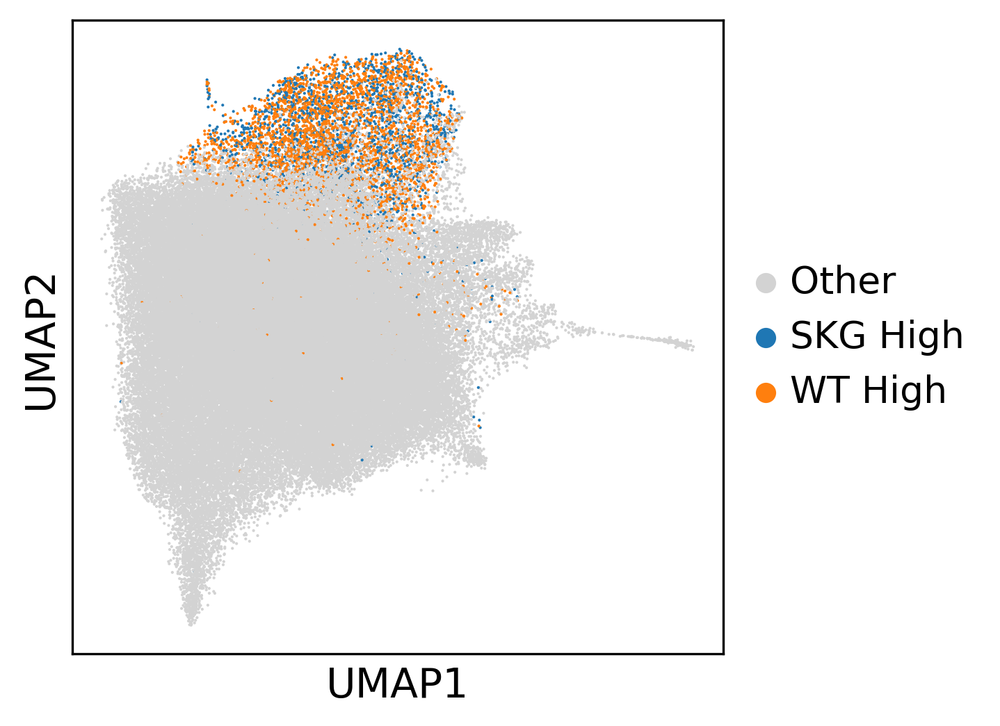

In [35]:
adata.obs['WT_SKG_Nr4a1'] = ['SKG High' if x == '3' and y == 'SKG_High' else 'WT High' if x == '3' and y == 'WT_High' else 'Other' for x,y in zip(adata.obs['cell_types'],adata.obs['subgroup'])]
adata.uns['WT_SKG_Nr4a1_colors'] = ['lightgrey','#1f77b4', '#ff7f0e']
sc.pl.umap(adata, color = 'WT_SKG_Nr4a1', title = "" ,  size = 4)#, save = "_SKG_hi_WT_hi_for_volcano_plot_fig_2.svg")


# Differential expression of SKG Low versus WT Low in T.4N Nr4a1 high cluster

In [3]:
nr4a1_df_subset = pd.read_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_Nr4a1_high_cluster_versus_other_cells.csv')
nr4a1_df_subset.index =  nr4a1_df_subset['gene']
min_cutoff = 0.01
nr4a1_df_subset_2 = nr4a1_df_subset[[x > min_cutoff for x in nr4a1_df_subset['T.4N_Nr4a1_percent']]]
adata_subset = adata[adata.obs['cell_types'] == '3']
adata_subset = adata_subset[[x in ['SKG_Low', 'WT_Low'] for x in adata_subset.obs['subgroup']]]
adata_subset

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_032021/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 1132 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype', 'Biocarta_Nfkb'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
nr4a1_df_subset = pd.read_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_Nr4a1_high_cluster_versus_other_cells.csv')
nr4a1_df_subset.index =  nr4a1_df_subset['gene']
nr4a1_df_subset

,gene,logfoldchange,adj_p_value,T.4N_Nr4a1_percent,other_percent
gene,,,,,
Nr4a1,Nr4a1,6.099972,2.225074e-308,0.737461,0.084207
Ptma,Ptma,0.903191,2.225074e-308,0.992551,0.979545
Cd5,Cd5,1.834791,2.225074e-308,0.813441,0.463104
Hsp90ab1,Hsp90ab1,0.943330,2.225074e-308,0.975501,0.929509
Eif5a,Eif5a,1.004779,2.225074e-308,0.911935,0.820397
...,...,...,...,...,...
Tmsb4x,Tmsb4x,-0.403891,2.225074e-308,0.997683,0.998560
Myl12b,Myl12b,-0.698822,2.225074e-308,0.899520,0.963787
Txnip,Txnip,-1.292243,2.225074e-308,0.463334,0.709791


In [9]:
adata_subset = adata[adata.obs['cell_types'] == '3']
adata_subset = adata_subset[[x in ['SKG_Low', 'WT_Low'] for x in adata_subset.obs['subgroup']]]
adata_subset

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_032021/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 1132 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype', 'Biocarta_Nfkb'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
sc.tl.rank_genes_groups(adata_subset, 'subgroup', n_genes = len(adata_subset.raw.var_names), use_raw=True, groups='all',
                           reference='rest', rankby_abs=False, key_added=None,
                           copy=False, method='wilcoxon',
                           corr_method='benjamini-hochberg', log_transformed=True)


ranking genes
Trying to set attribute `.uns` of view, copying.
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


In [11]:
cluster = 'SKG_Low'
gene_names =  np.array(adata_subset.uns['rank_genes_groups']['names'][cluster])
log_changes = np.array(adata_subset.uns['rank_genes_groups']['logfoldchanges'][cluster])
p_values = np.array(adata_subset.uns['rank_genes_groups']['pvals'][cluster])
adj_p_values = np.array(adata_subset.uns['rank_genes_groups']['pvals_adj'][cluster])


In [6]:
df_1 = pd.DataFrame.from_dict({'gene':gene_names, 'log_fold_change':log_changes, 'p_value':p_values, 'adj_p_value':adj_p_values})
df_1.index = df_1['gene']
df_1_subset = df_1.loc[list(nr4a1_df_subset_2.index),:]
df_1_subset.to_csv('results/single_cell_RNA_seq/differential_expression/diff_genes_SKG_Low_v_WT_Low_Nr4a1_cluster.csv', index = False)

# Differential expression for SKG High v WT High in T.4N Nr4a1 high cluster

In [3]:
nr4a1_df_subset = pd.read_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_Nr4a1_high_cluster_versus_other_cells.csv')

In [11]:
nr4a1_df_subset.index =  nr4a1_df_subset['gene']

In [14]:
min_cutoff = 0.01
nr4a1_df_subset_2 = nr4a1_df_subset[[x > min_cutoff for x in nr4a1_df_subset['T.4N_Nr4a1_percent']]]

In [9]:
adata_subset = adata[adata.obs['cell_types'] == '3']

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_032021/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [10]:
adata_subset = adata_subset[[x in ['SKG_High', 'WT_High'] for x in adata_subset.obs['subgroup']]]
adata_subset

View of AnnData object with n_obs × n_vars = 4909 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'cell_types_colors', 'genes', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
sc.tl.rank_genes_groups(adata_subset, 'subgroup', n_genes = len(adata_subset.raw.var_names), use_raw=True, groups='all',
                           reference='rest', rankby_abs=False, key_added=None,
                           copy=False, method='wilcoxon',
                           corr_method='benjamini-hochberg', log_transformed=True)


ranking genes
Trying to set attribute `.uns` of view, copying.
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


In [13]:
cluster = 'SKG_High'
gene_names =  np.array(adata_subset.uns['rank_genes_groups']['names'][cluster])
log_changes = np.array(adata_subset.uns['rank_genes_groups']['logfoldchanges'][cluster])
p_values = np.array(adata_subset.uns['rank_genes_groups']['pvals'][cluster])
adj_p_values = np.array(adata_subset.uns['rank_genes_groups']['pvals_adj'][cluster])


In [15]:
df_1 = pd.DataFrame.from_dict({'gene':gene_names, 'log_fold_change':log_changes, 'p_value':p_values, 'adj_p_value':adj_p_values})
df_1.index = df_1['gene']
df_1_subset = df_1.loc[list(nr4a1_df_subset_2.index),:]
df_1_subset.to_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_SKG_High_v_WT_High_Nr4a1_cluster.csv', index = False)

In [49]:
gene_names = adata_subset.uns['rank_genes_groups']['names']['SKG_High']
log_changes = adata_subset.uns['rank_genes_groups']['logfoldchanges']['SKG_High']
p_values = adata_subset.uns['rank_genes_groups']['pvals']['SKG_High']

rank_df_1 = pd.DataFrame.from_dict({'gene':gene_names, 'log_fold_change':log_changes, 'p_value':p_values})
rank_df_1.index = rank_df_1['gene']

rank_df_1_subset = rank_df_1.loc[list(nr4a1_df_subset_2.index),:]
rank_df_1_subset["rank"] = np.sign(rank_df_1_subset["log_fold_change"]) * -np.log10(rank_df_1_subset["p_value"])

rank_df_1_subset = rank_df_1_subset.sort_values('rank', ascending = False)
rank_df_1_subset.loc[:,['gene','rank']].to_csv('results/single_cell_RNA_seq/ranked_lists/SKG_High_v_WT_High_Nr4a1_high_cluster.rnk', index = False, sep = "\t")

# Volcano Plot for SKG High v WT High in T.4N Nr4a1 cluster

['Ikzf3', 'Cd5', 'Izumo1r', 'Relb', 'Nr4a1', 'eGFP', 'Cd6', 'Nfkbia', 'Lag3', 'Tnfrsf9', 'Egr1', 'Tnfrsf4', 'Icam1', 'Nr4a3', 'Myb', 'Pdcd1']


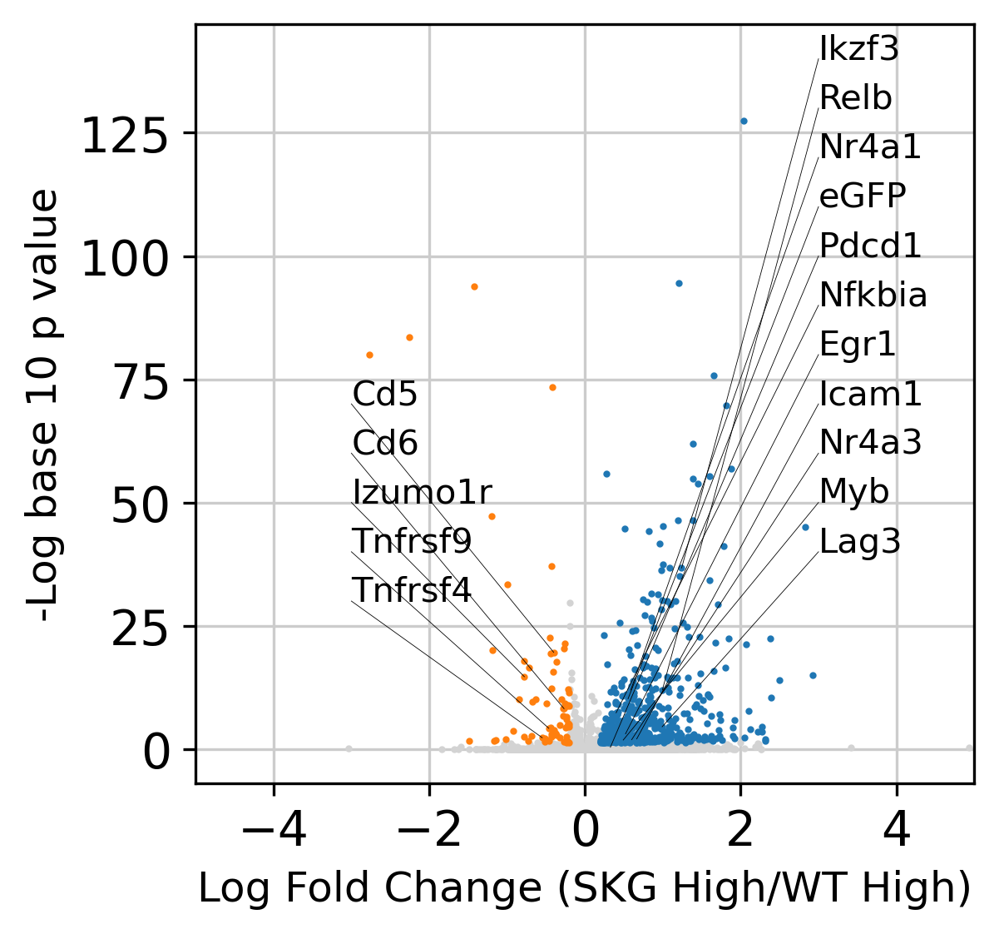

In [58]:
#file_save_prefix = "results/single_cell_RNA_seq/"
df_1_subset['logpvalue'] = [-np.log10(x) for x in df_1_subset['adj_p_value']]
data_to_plot = df_1_subset
data_to_plot = data_to_plot.sort_values("logpvalue", ascending = False)
plt.rc('axes', axisbelow=True)


color_values = {(True,True, True):"#1f77b4", (False, True, True): "#ff7f0e"}
colors = [color_values.get((x > 0, abs(x) > 0.2, y > -np.log10(0.05)), "lightgrey") for x,y in zip(data_to_plot['log_fold_change'], data_to_plot['logpvalue'])]
for color in ['lightgrey',"#1f77b4", "#ff7f0e"]:
    subset_data = data_to_plot[[x == color for x in colors]]
    plt.scatter(list(subset_data['log_fold_change']),list(subset_data['logpvalue']), s = 1, edgecolors=color, color =  color)

plt.xlim((-5, 5)) 
plt.xlabel("Log Fold Change (SKG High/WT High)", size = 12)
plt.ylabel("-Log base 10 p value", size = 12)
# Label names and positions
x = [i for i in data_to_plot['log_fold_change']]
y = [i for i in data_to_plot['logpvalue']]
labels_orig = data_to_plot["gene"]

genes_to_label_left = list()
genes_to_label_right = ['Cd5','Nr4a1', 'Lag3', 'Tnfrsf9', 'Egr1', 'Tnfrsf4', 'Nr4a3', 'Myb', 'Pdcd1', 'Cd6','Izumo1r','eGFP','Relb','Ikzf3','Nfkbia','Icam1']



genes_to_label = genes_to_label_left  + genes_to_label_right

to_keep = np.where([i in genes_to_label for i in labels_orig])[0]
labels = list(np.array(labels_orig)[to_keep])
print(labels)
x = list(np.array(x)[to_keep])
y = list(np.array(y)[to_keep])



amt_horiz_dict = {"left":-2, "right":2}
['Ikzf3', 'Cd5', 'Izumo1r', 
 'Relb', 'Nr4a1', 'eGFP', 'Cd6',
 'Nfkbia', 'Lag3', 'Tnfrsf9', 
 'Egr1', 'Tnfrsf4', 
 'Icam1', 'Nr4a3', 'Myb', 'Pdcd1']

amt_vert = [140,70,50,
            130,120,110,60,
            90,40,40,
            80,30,
            70,60,50,100]
amt_horiz = [3,-3,-3,
             3,3,3,-3,
             3,3,-3,3,-3,3,3,3,3]

for i,txt in enumerate(labels):
    plt.plot([x[i],amt_horiz[i]],[y[i],amt_vert[i]], linewidth = 0.2, color = 'black')
    plt.annotate(txt, (amt_horiz[i], amt_vert[i]), size = 10)
    #t.set_bbox(dict(facecolor='white', alpha=1, edgecolor='white',pad=0.01))


#plt.savefig(file_save_prefix + "fig_2D_SKG_High_v_WT_High_volcano_plot_081021.svg", format="svg")

plt.show()
plt.close()

# UMAPs for gene markers

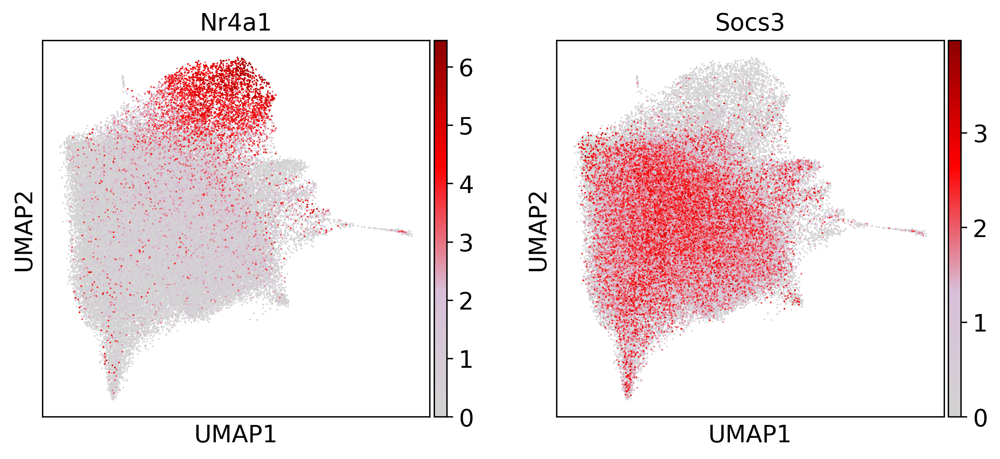

In [60]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred'])
sc.pl.umap(adata, color = ['Nr4a1','Socs3','Tnfrsf9','Egr2','eGFP','Rgs10','Cd5','Cd6','Izumo1r','Ephx1','Id2','Tnfrsf9','Egr1','Egr2','Egr3'], cmap = cmap, size = 4, use_raw = True)

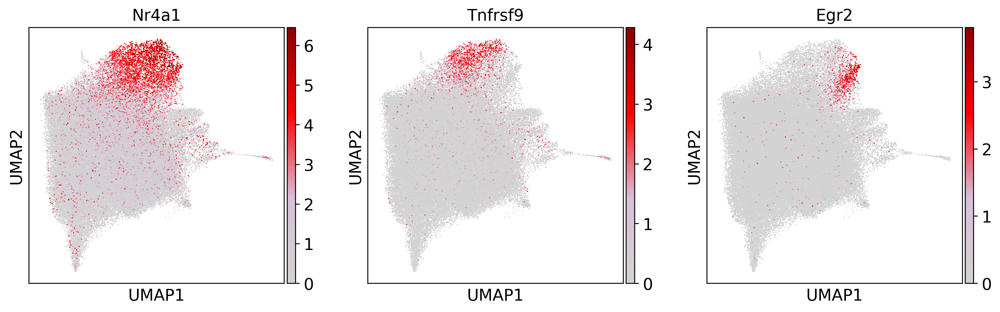

In [62]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred'])
sc.pl.umap(adata, color = ['Nr4a1','Tnfrsf9','Egr2'], cmap = cmap, size = 4, use_raw = True)

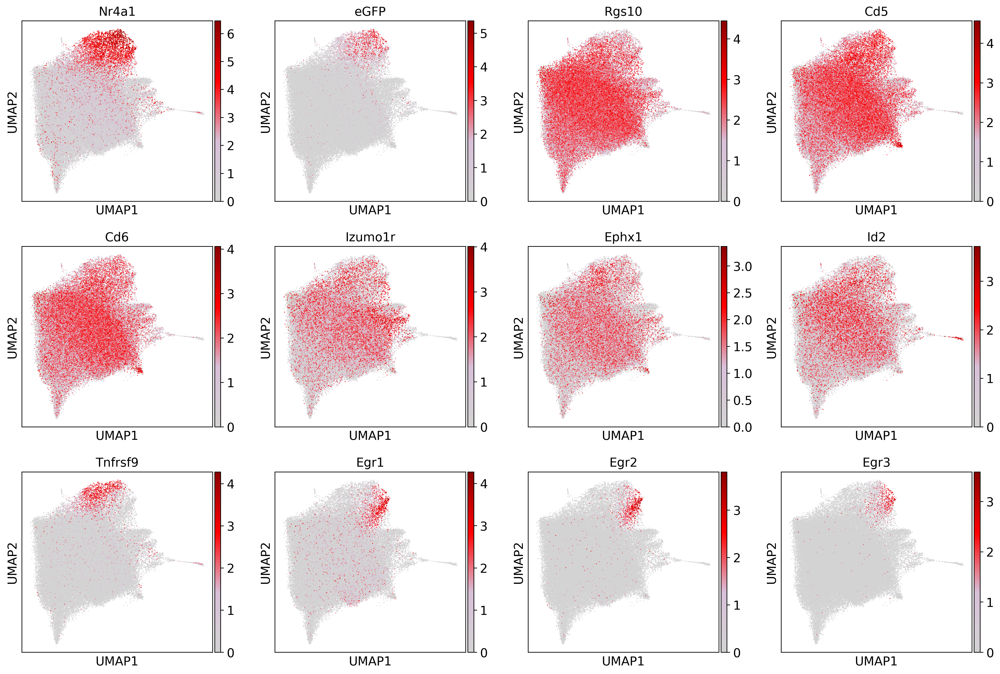

In [61]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred'])
sc.pl.umap(adata, color = ['Nr4a1','eGFP','Rgs10','Cd5','Cd6','Izumo1r','Ephx1','Id2','Tnfrsf9','Egr1','Egr2','Egr3'], cmap = cmap, size = 4, use_raw = True)

# Correlation Heatmaps

In [ ]:
#Subset data to highly variable genes (hvg)
gene_data = adata.raw.X[:,np.where([x in adata.var.index for x in adata.raw.var.index])[0]].todense()
cor_gene_data = pd.DataFrame(gene_data).corr(method = "spearman")
cor_gene_data.index = adata.raw.var.index[np.where([x in adata.var.index for x in adata.raw.var.index])[0]]
cor_gene_data.columns = adata.raw.var.index[np.where([x in adata.var.index for x in adata.raw.var.index])[0]]
print("done")

#To save the matrix
file_path = 'results/single_cell_RNA_seq/correlations/gene_correlations_for_hvg_mouse_all_cells_spearman.csv'
cor_gene_data.to_csv(file_path)
print("done")

In [ ]:
#Subset data for Nr4a1 high cluster and for highly variable genes (hvg)
gene_data = adata[np.where([x == '3' for x in adata.obs['cell_types']])[0],:].raw.X[:,np.where([x in adata.var.index for x in adata.raw.var.index])[0]].todense()
cor_gene_data = pd.DataFrame(gene_data).corr(method = "spearman")
cor_gene_data.index = adata.raw.var.index[np.where([x in adata.var.index for x in adata.raw.var.index])[0]]
cor_gene_data.columns = adata.raw.var.index[np.where([x in adata.var.index for x in adata.raw.var.index])[0]]
print("done")

#To save the matrix
file_path = 'results/single_cell_RNA_seq/correlations/gene_correlations_for_hvg_mouse_Nr4a1_hi_cluster_spearman.csv'
cor_gene_data.to_csv(file_path)
print("done")

In [17]:
def heatmap_sg(gene_1, cor_data, vmin = -0.5, vmax = 0.5, file_save = None, mask = False, row_cluster = True):
    
    sns.set(font_scale=3, rc={'axes.facecolor':'darkgrey'})
    gene_set_1 = list(cor_data.sort_values(by=gene_1, axis=1, ascending = False).loc[gene_1,:][0:25].index)

    gene_set_2 = list(cor_data.sort_values(by=gene_1, axis=1, ascending = True).loc[gene_1,:][0:25].index)
    if mask == True:
        #mask = np.triu(np.ones_like(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], dtype=bool))
        #fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], mask = mask, yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=True, col_cluster=True, vmin = vmin, vmax = vmax )
        #mask = mask[np.argsort(fig.dendrogram_row.reordered_ind),:]
        #mask = mask[:,np.argsort(fig.dendrogram_col.reordered_ind)]
        fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], mask=(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2]==1), yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=row_cluster, col_cluster=True, vmin = vmin, vmax = vmax )
        #fig.set_facecolor('xkcd:white')
    else:
        fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=True, col_cluster=True, vmin = vmin, vmax = vmax )
    #plt.title()
    if file_save != None:
        plt.savefig(file_save +".svg", format="svg")
    plt.show()

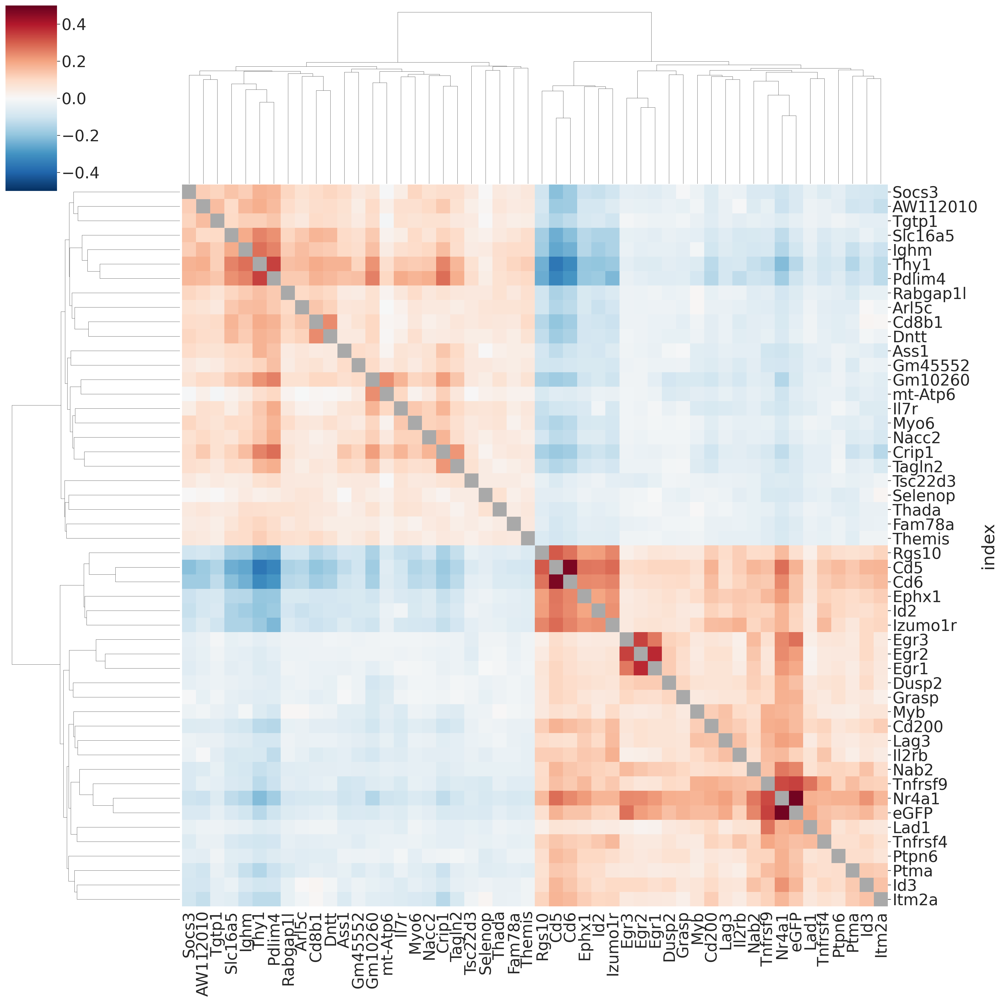

In [18]:
file_path = 'results/single_cell_RNA_seq/correlations/gene_correlations_for_hvg_mouse_all_cells_spearman.csv'

cor_gene_data = pd.read_csv(file_path, index_col = 0)


gene_1 = "Nr4a1"

#file_path_prefix = 

sns.set(rc={'axes.facecolor':'darkgrey'})

heatmap_sg(gene_1, cor_gene_data, mask=True) #file_save = file_path_prefix + "heatmap_all_cells_top_and_bottom_25_Nr4a1_spearman_mask")



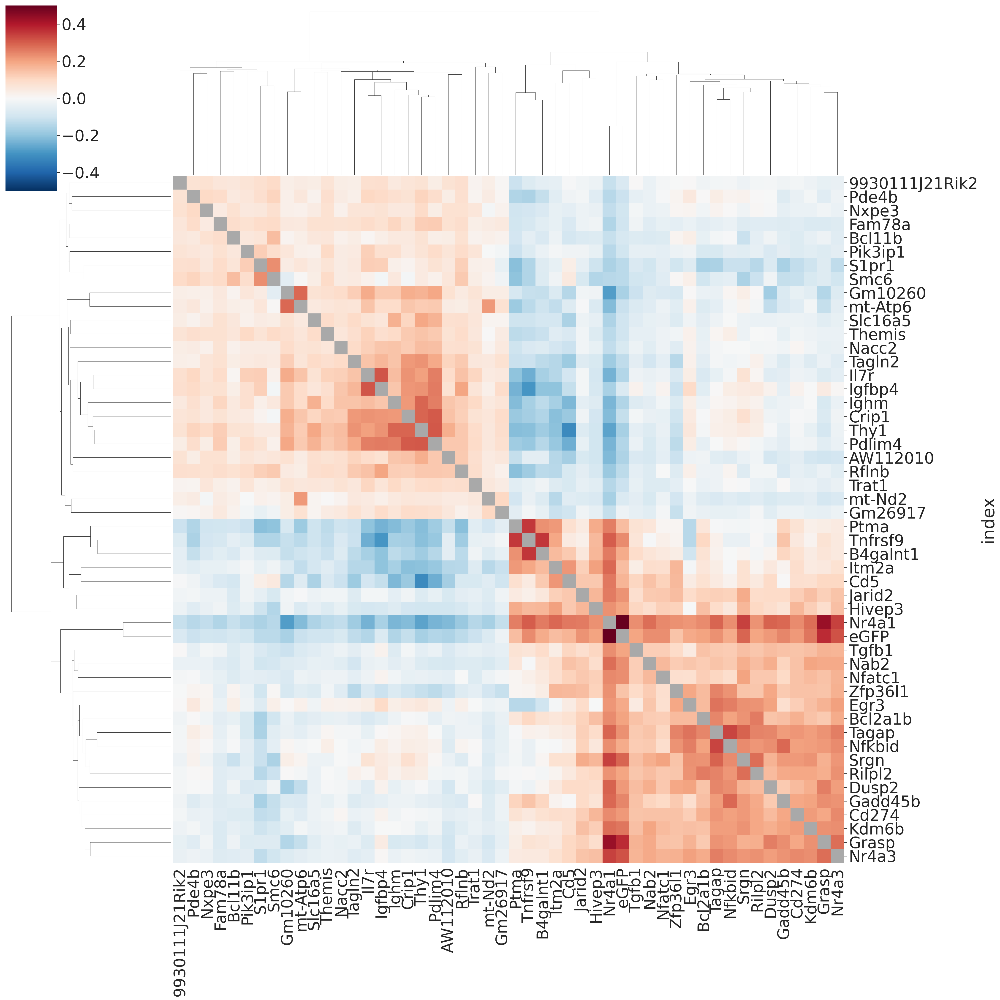

In [21]:
file_path = 'results/single_cell_RNA_seq/correlations/gene_correlations_for_hvg_mouse_Nr4a1_hi_cluster_spearman.csv'

cor_gene_data = pd.read_csv(file_path, index_col = 0)

gene_1 = "Nr4a1"

#file_path_prefix = 

sns.set(rc={'axes.facecolor':'darkgrey'})

heatmap_sg(gene_1, cor_gene_data, mask = True)#, file_save = file_path_prefix + "heatmap_cluster_7_top_and_bottom_25_Nr4a1_spearman_mask")

In [27]:
def heatmap_sg_two_genes(gene_1, geen_2, cor_data, vmin = -0.5, vmax = 0.5, file_save = None, mask = False, row_cluster = False):
    
    sns.set(font_scale=3, rc={'axes.facecolor':'darkgrey'})
    gene_set_1 = list(cor_data.sort_values(by=gene_1, axis=1, ascending = False).loc[gene_1,:][0:25].index)

    gene_set_2 = list(cor_data.sort_values(by=gene_2, axis=1, ascending = False).loc[gene_1,:][0:25].index)
    if mask == True:
        #mask = np.triu(np.ones_like(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], dtype=bool))
        #fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], mask = mask, yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=True, col_cluster=True, vmin = vmin, vmax = vmax )
        #mask = mask[np.argsort(fig.dendrogram_row.reordered_ind),:]
        #mask = mask[:,np.argsort(fig.dendrogram_col.reordered_ind)]
        fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], mask=(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2]==1), yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=row_cluster, col_cluster=row_cluster, vmin = vmin, vmax = vmax )
        #fig.set_facecolor('xkcd:white')
    else:
        fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=row_cluster, col_cluster=row_cluster, vmin = vmin, vmax = vmax )
    #plt.title()
    if file_save != None:
        plt.savefig(file_save +".svg", format="svg")
    plt.show()

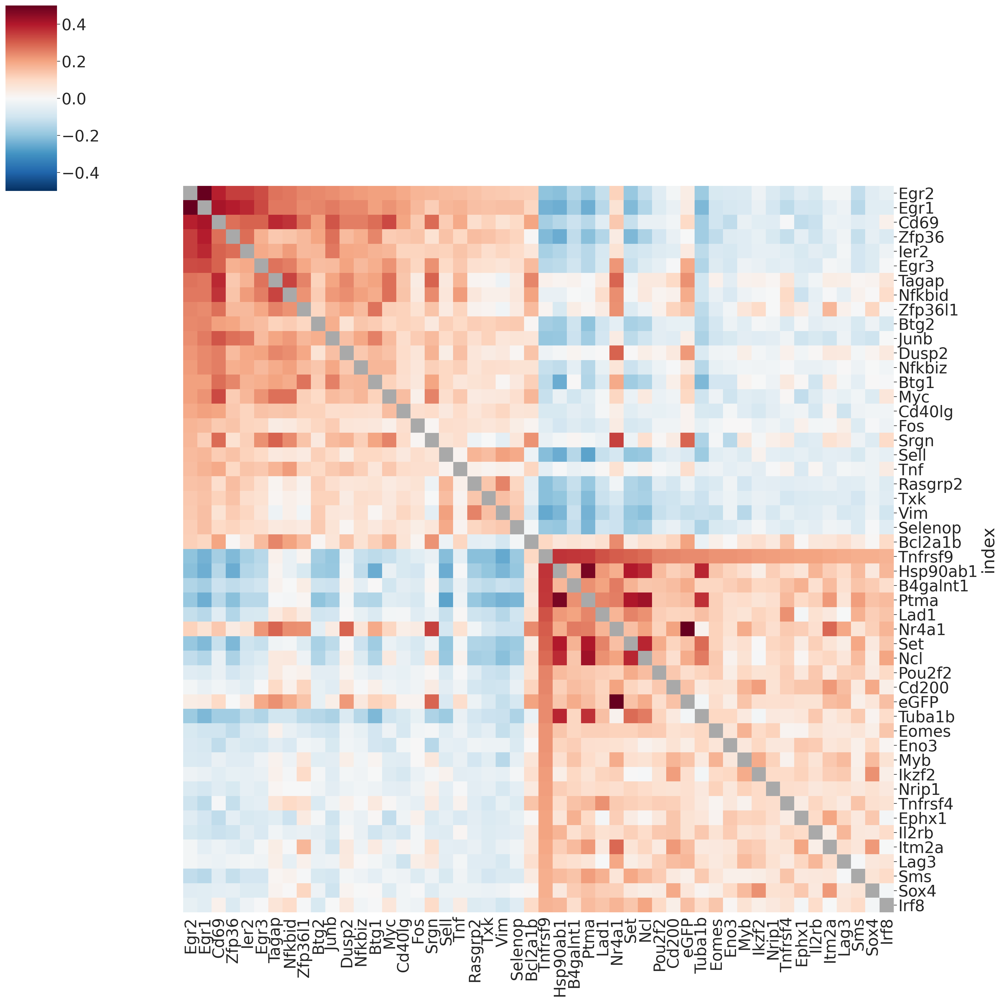

In [28]:
file_path = 'results/single_cell_RNA_seq/correlations/gene_correlations_for_hvg_mouse_Nr4a1_hi_cluster_spearman.csv'

cor_gene_data = pd.read_csv(file_path, index_col = 0)

gene_1 = "Egr2"
gene_2 = "Tnfrsf9"

#file_path_prefix = 

sns.set(rc={'axes.facecolor':'darkgrey'})

heatmap_sg_two_genes(gene_1, gene_2, cor_gene_data, mask = True)#, file_save = file_path_prefix + "heatmap_Nr4a1_high_cluster_top_25_Egr2_Tnfrsf9_spearman_mask")

# Natural anergy signature by Egr2 and Tnfrsf9 subgroups

In [3]:
adata_test = adata[adata.obs['cell_types'] == '3']
adata_test.obs['Tnf_cat'] = [(x>1, y>1) for x,y in zip(np.array(adata_test.raw[:,"Tnfrsf9"].X.todense()).ravel(),np.array(adata_test.raw[:,"Egr2"].X.todense()).ravel())]
conversion = {(False,False): "EgrnegTnfrsf9neg",(False,True):"Egr2 High", (True, False):"Tnfrsf9 High", (True,True):"EgrposTnfrsf9pos"}
adata_test.obs['Tnf_Egr_cat'] = [conversion[x] for x in adata_test.obs['Tnf_cat']]
adata_test = adata_test[[x in ['Egr2 High', 'Tnfrsf9 High'] and y in ['SKG_High','WT_High'] for x,y in zip(adata_test.obs['Tnf_Egr_cat'],adata_test.obs['subgroup'])]]
adata_test.obs['cat_subgroup'] = [x+" " + y for x,y in zip(adata_test.obs['subgroup'], adata_test.obs['Tnf_Egr_cat'])]
np.unique(adata_test.obs['cat_subgroup'])

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_032021/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


array(['SKG_High Egr2 High', 'SKG_High Tnfrsf9 High', 'WT_High Egr2 High',
       'WT_High Tnfrsf9 High'], dtype=object)

In [ ]:
#Natural anergy
genes = ['Egr2','Egr3','Tnfrsf9',  'Izumo1r', 'Tigit', 'Cd5', 'S100a11']

order = [  
       'WT_High Tnfrsf9 High', 'SKG_High Tnfrsf9 High', 'WT_High Egr2 High','SKG_High Egr2 High']

sc.pl.matrixplot(adata_test, genes, groupby = 'cat_subgroup', use_raw = True,standard_scale = 'var',categories_order = order,
              swap_axes = False, save =  "fig3_heatmap_natural_anergy_subset_plus_Cd5_Nr4a1_high_cluster_by_Egr2_Tnfrsf9_cat_SKG_WT_high_only.svg")

In [5]:
nr4a1_df_subset = pd.read_csv('results/single_cell_RNA_seq/differential_expression/data_S5_diff_genes_Nr4a1_high_cluster_versus_other_cells.csv')
nr4a1_df_subset.index =  nr4a1_df_subset['gene']
min_cutoff = 0.01
nr4a1_df_subset_2 = nr4a1_df_subset[[x > min_cutoff for x in nr4a1_df_subset['T.4N_Nr4a1_percent']]]
nr4a1_df_subset_2

,gene,logfoldchange,adj_p_value,T.4N_Nr4a1_percent,other_percent
gene,,,,,
Nr4a1,Nr4a1,6.099972,2.225074e-308,0.737461,0.084207
Ptma,Ptma,0.903191,2.225074e-308,0.992551,0.979545
Cd5,Cd5,1.834791,2.225074e-308,0.813441,0.463104
Hsp90ab1,Hsp90ab1,0.943330,2.225074e-308,0.975501,0.929509
Eif5a,Eif5a,1.004779,2.225074e-308,0.911935,0.820397
...,...,...,...,...,...
Tmsb4x,Tmsb4x,-0.403891,2.225074e-308,0.997683,0.998560
Myl12b,Myl12b,-0.698822,2.225074e-308,0.899520,0.963787
Txnip,Txnip,-1.292243,2.225074e-308,0.463334,0.709791


In [ ]:
sc.tl.rank_genes_groups(adata_test, 'cat_subgroup', n_genes = len(adata_test.raw.var_names), use_raw=True, groups=['SKG_High Tnfrsf9 High'],
                           reference='WT_High Tnfrsf9 High', rankby_abs=False, key_added=None,
                           copy=False, method='wilcoxon',
                           corr_method='benjamini-hochberg', log_transformed=True, only_positive = True)

In [11]:
gene_names = adata_test.uns['rank_genes_groups']['names']['SKG_High Tnfrsf9 High']
log_changes = adata_test.uns['rank_genes_groups']['logfoldchanges']['SKG_High Tnfrsf9 High']
p_values = adata_test.uns['rank_genes_groups']['pvals']['SKG_High Tnfrsf9 High']
adj_p_values = adata_test.uns['rank_genes_groups']['pvals_adj']['SKG_High Tnfrsf9 High']

updated_p_values = np.array(adj_p_values)
print(np.sum([x == 0 for x in updated_p_values]))
updated_p_values[[x == 0 for x in updated_p_values]] = 2.2250738585072014e-308
print(np.sum([x == 0 for x in updated_p_values]))


updated_raw_p_values = np.array(p_values)
print(np.sum([x == 0 for x in updated_raw_p_values]))
updated_raw_p_values[[x == 0 for x in updated_raw_p_values]] = 2.2250738585072014e-308
print(np.sum([x == 0 for x in updated_raw_p_values]))

df_1 = pd.DataFrame.from_dict({'gene':gene_names, 'logfoldchange':log_changes, 'p_value': updated_raw_p_values, 'adj_p_value':updated_p_values})

df_1.index = df_1['gene']

df_1_subset = df_1.loc[list(nr4a1_df_subset_2['gene']),:]
df_1_subset.to_csv('results/single_cell_RNA_seq/differential_expression/diff_exp_SKG_High_versus_WT_high_Tnfrsf9_pos_Nr4a1_hi_cluster.csv', index = False)

df_1_subset['logpvalue'] = [-np.log10(x) for x in df_1_subset['adj_p_value']]

0
0
0
0


# Volcano Plot Egr2 High v Tnfrsf9 High

In [6]:
sc.tl.rank_genes_groups(adata_test, 'Tnf_Egr_cat', n_genes = len(adata_test.raw.var_names), use_raw=True, groups='all',
                           reference='rest', rankby_abs=False, key_added=None,
                           copy=False, method='wilcoxon',
                           corr_method='benjamini-hochberg', log_transformed=True, only_positive = True)

ranking genes
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_032021/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'Tnf_cat' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Tnf_Egr_cat' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


In [16]:
gene_names = adata_test.uns['rank_genes_groups']['names']['Tnf_high']
log_changes = adata_test.uns['rank_genes_groups']['logfoldchanges']['Tnf_high']
p_values = adata_test.uns['rank_genes_groups']['pvals']['Tnf_high']
adj_p_values = adata_test.uns['rank_genes_groups']['pvals_adj']['Tnf_high']

updated_p_values = np.array(adj_p_values)
print(np.sum([x == 0 for x in updated_p_values]))
updated_p_values[[x == 0 for x in updated_p_values]] = 2.2250738585072014e-308
print(np.sum([x == 0 for x in updated_p_values]))


updated_raw_p_values = np.array(p_values)
print(np.sum([x == 0 for x in updated_raw_p_values]))
updated_raw_p_values[[x == 0 for x in updated_raw_p_values]] = 2.2250738585072014e-308
print(np.sum([x == 0 for x in updated_raw_p_values]))

df_1 = pd.DataFrame.from_dict({'gene':gene_names, 'logfoldchange':log_changes, 'p_value': updated_raw_p_values, 'adj_p_value':updated_p_values})

df_1.index = df_1['gene']

df_1_subset = df_1.loc[list(nr4a1_df_subset_2['gene']),:]
df_1_subset.to_csv('results/single_cell_RNA_seq/differential_expression/data_S6_diff_exp_Tnfrsf9_pos_Egr2_pos_Nr4a1_hi_cluster.csv', index = False)

df_1_subset['logpvalue'] = [-np.log10(x) for x in df_1_subset['adj_p_value']]

2
0
2
0


In [43]:
#Create ranked list
df_1_subset["rank"] = np.sign(-df_1_subset["logfoldchange"]) * -np.log10(df_1_subset["p_value"])

df_1_subset = df_1_subset.sort_values('rank', ascending = False)
df_1_subset.loc[:,['gene','rank']].to_csv('results/single_cell_RNA_seq/ranked_lists/Nr4a1_high_cluster_Egr_high_v_Tnf_high_genes.rnk', index = False, sep = "\t")

In [44]:
df_1_subset.loc[:,['gene','rank']]

,gene,rank
gene,,
Egr2,Egr2,307.652656
Egr1,Egr1,222.538721
Zfp36,Zfp36,156.962452
Cd69,Cd69,144.522739
Ier2,Ier2,130.507986
...,...,...
B4galnt1,B4galnt1,-108.356084
Eif5a,Eif5a,-116.043382
Ptma,Ptma,-124.514467


In [13]:
sc.settings.set_figure_params(dpi=300)

In [16]:
df_1_subset = pd.read_csv('results/single_cell_RNA_seq/differential_expression/data_S6_diff_exp_Tnfrsf9_pos_Egr2_pos_Nr4a1_hi_cluster.csv')
df_1_subset['logpvalue'] = [-np.log10(x) for x in df_1_subset['adj_p_value']]
df_1_subset



,gene,logfoldchange,p_value,adj_p_value,logpvalue
0,Nr4a1,0.633098,9.052858e-08,2.425642e-06,5.615173
1,Ptma,0.872311,3.058673e-125,6.371980e-122,121.195726
2,Cd5,0.196721,7.705226e-02,4.897609e-01,0.310016
3,Hsp90ab1,1.187080,1.517117e-130,3.612039e-127,126.442248
4,Eif5a,1.364349,9.049355e-117,1.675739e-113,112.775794
...,...,...,...,...,...
9448,Tmsb4x,-0.711568,8.717098e-114,1.452792e-110,109.837797
9449,Myl12b,-0.995333,8.145896e-75,6.170887e-72,71.209652
9450,Txnip,-0.388235,1.350040e-03,1.617742e-02,1.791091
9451,Thy1,-1.202713,3.651025e-26,4.716898e-24,23.326344


['Egr2', 'Egr1', 'Egr3', 'Cd69', 'Nfkbiz', 'Ier2', 'Myc', 'Btg2', 'Fos', 'Nfkbid', 'Junb', 'Cd40lg', 'Dusp2', 'Nr4a1', 'eGFP', 'Itm2a', 'Hsp90ab1', 'Cd200', 'Lag3', 'B4galnt1', 'Pou2f2', 'Ikzf2', 'Eno3', 'Myb', 'Tnfrsf4', 'Eomes', 'Lad1', 'Tnfrsf9']


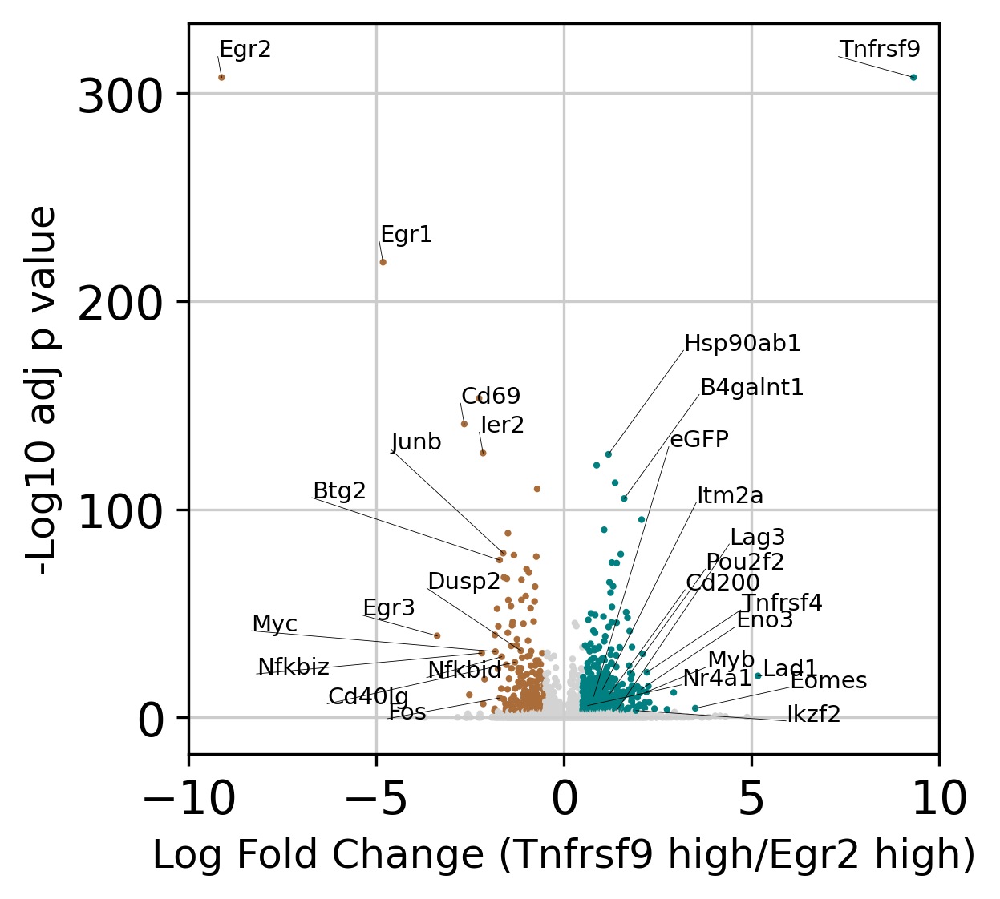

In [20]:
file_save_prefix = 'results/single_cell_RNA_seq/differential_expression/'
data_to_plot = df_1_subset
data_to_plot = data_to_plot.sort_values("logfoldchange")

color_values = {(True,True, True):'#008080', (False, True, True): '#aa6c39'}
colors = [color_values.get((x > 0, abs(x) > 0.5, y > -np.log(0.05)), "lightgrey") for x,y in zip(data_to_plot['logfoldchange'], data_to_plot['logpvalue'])]

plt.scatter(data_to_plot['logfoldchange'], data_to_plot['logpvalue'],color=colors, s = 1 )
plt.xlim((-10, 10)) 
plt.xlabel("Log Fold Change (Tnfrsf9 high/Egr2 high)", size = 12)
plt.ylabel("-Log10 adj p value", size = 12)
# Label names and positions
x = [i for i in data_to_plot['logfoldchange']]
y = [i for i in data_to_plot['logpvalue']]
labels = data_to_plot["gene"]

# Show only some labels to avoid overcrowding the figure

genes_to_label = ['Egr2', 'Egr1', 'Egr3', 'Cd69', 'Nfkbiz', 'Ier2', 'Myc', 'Btg2', 'Fos', 'Nfkbid', 'Junb', 'Cd40lg', 'Dusp2', 'Nr4a1', 'eGFP', 'Itm2a', 'Hsp90ab1', 'Cd200', 'B4galnt1', 'Ikzf2', 'Eno3', 'Myb', 'Tnfrsf4', 'Eomes', 'Lad1', 'Tnfrsf9', 'Pou2f2', 'Lag3']
#['Egr2', 'Egr1', 'Egr3', 'Cd69', 'Nfkbiz', 'Ier2', 'Myc', 'Btg2', 'Fos', 'Nfkbid', 'Junb', 'Cd40lg', 'Dusp2', 'Nr4a1', 'eGFP', 'Itm2a', 'Hsp90ab1', 'Cd200', 'Lag3', 'B4galnt1', 'Pou2f2', 'Ikzf2', 'Eno3', 'Myb', 'Tnfrsf4', 'Eomes', 'Lad1', 'Tnfrsf9']
to_keep = np.where([i in genes_to_label for i in labels])[0]
labels = list(np.array(labels)[to_keep])
print(labels)
x = list(np.array(x)[to_keep])
y = list(np.array(y)[to_keep])

amt_vert = [10,10,10,10,-10,10,10,30,-10,-10,50,-20,30] + [10,120,90,50,50,80,50,50,-5,30,12,30,10,0.1,10] 
amt_horiz = [-0.1, -0.1, -2, -0.1, -6,-0.1,-6.5,-5,-3,-2,-3,-5,-2.5] + [2.5,2,2.5,2,2,3,2,2,4,2.5,1.6,2.5,2.5,0.1,-2] 
for i,txt in enumerate(labels):
    plt.plot([x[i],x[i]+amt_horiz[i]],[y[i],y[i]+amt_vert[i]], 'k-', linewidth = 0.2)
    plt.annotate(txt, (x[i]+amt_horiz[i], y[i]+amt_vert[i]), size = 7)
plt.savefig(file_save_prefix + "fig_3C_Egr2_high_v_Tnfrsf9_high_volcano_plot_extra_genes_061323.svg", format="svg")

plt.show()
plt.close()

# Cell Cycle Analysis

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_032021/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


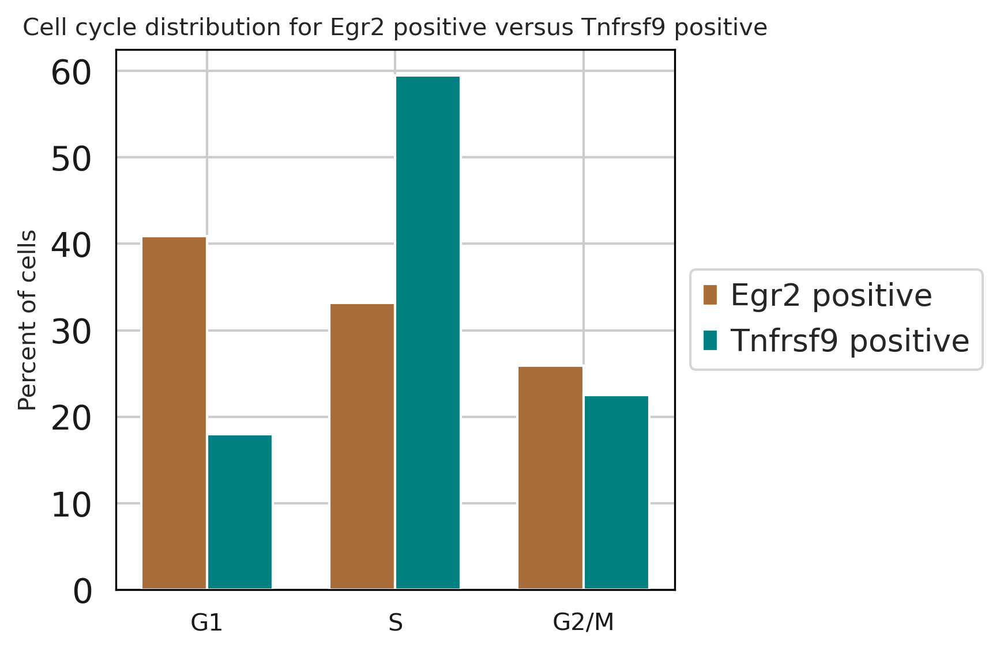

In [45]:

#file_save_prefix = 
plt.rc('axes', axisbelow=True)
labels = ['G1', 'S', 'G2/M']
group_names = ['G1', 'S', 'G2M']
group = 'Egr_high'
phase,counts = np.unique(adata_test[adata_test.obs['Tnf_Egr_cat'] == group].obs['phase'], return_counts = True)
percent = counts/np.sum(counts)*100
phase_dict = {x:y for x,y in zip(phase, percent)}
group_1_values = [phase_dict[x] for x in group_names]

group = 'Tnf_high'
phase,counts = np.unique(adata_test[adata_test.obs['Tnf_Egr_cat'] == group].obs['phase'], return_counts = True)
percent = counts/np.sum(counts)*100
phase_dict = {x:y for x,y in zip(phase, percent)}
group_2_values = [phase_dict[x] for x in group_names]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(6,4))
rects1 = ax.bar(x - width/2, group_1_values, width, label='Egr2 positive', color = '#aa6c39')
rects2 = ax.bar(x + width/2, group_2_values, width, label='Tnfrsf9 positive', color = '#008080')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percent of cells',  fontsize = 10)
ax.set_title('Cell cycle distribution for Egr2 positive versus Tnfrsf9 positive',  fontsize = 10)
ax.set_xticks(x)
ax.set_xticklabels(labels,  fontsize = 10)


ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

fig.tight_layout()
#plt.savefig(file_save_prefix + "supp_fig_3D_barplot_cell_cycle_assignment_by_Egr2_Tnfrsf9_groupings.svg", format="svg")
plt.show()
plt.close()

Trying to set attribute `.uns` of view, copying.


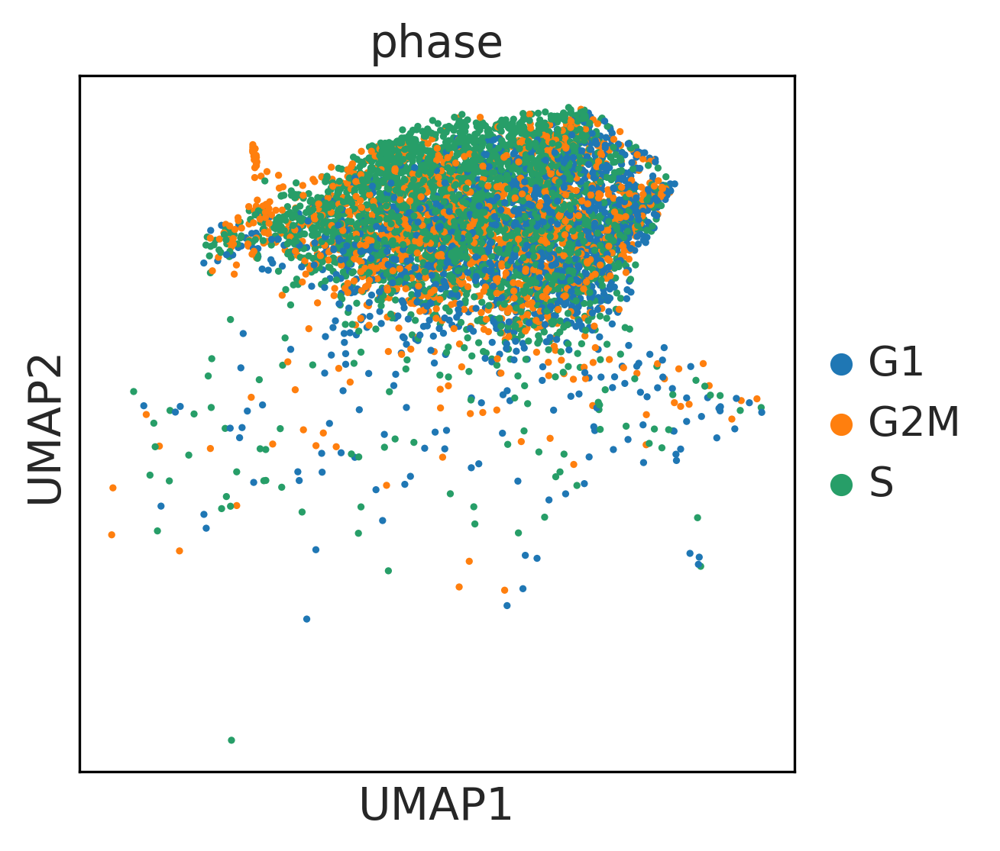

In [46]:
adata_subset = adata[adata.obs['cell_types'] == '3']
sc.pl.umap(adata_subset, color = 'phase')